# Project 10: Chapter 8: Advanced Data Analysis

## Using a Double Index to Work with Panel Data


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

data = pd.read_csv("fraserDataWithRGDPPC.csv",
                  index_col = ["ISO_Code_3","Year"],
                 # parse_dates = True adds the month and day onto year format
                  parse_dates = True).rename(columns = {"Summary":"EFW"})
data

ISO_Code_2   World Bank Region  \
ISO_Code_3 Year                                        
AGO        1970-01-01         AO  Sub-Saharan Africa   
           1975-01-01         AO  Sub-Saharan Africa   
           1980-01-01         AO  Sub-Saharan Africa   
           1985-01-01         AO  Sub-Saharan Africa   
           1990-01-01         AO  Sub-Saharan Africa   
...                          ...                 ...   
ZWE        2016-01-01         ZW  Sub-Saharan Africa   
           2017-01-01         ZW  Sub-Saharan Africa   
           2018-01-01         ZW  Sub-Saharan Africa   
           2019-01-01         ZW  Sub-Saharan Africa   
           2020-01-01         ZW  Sub-Saharan Africa   

                      World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)  \
ISO_Code_3 Year                                                                                                                                              
AGO        1970-01-01                                                NaN                                                                                     
           1975-01-01                                                NaN                                                                                     
           1980-01-01                                                NaN                                                                                     
           1985-01-01                                                NaN                                                                                     
           1990-01-01                                                 LM                                                                                     
...                                                                  ...                                                                                     
ZWE        2016-01-01                                                  L                                                                                     
           2017-01-01                                                  L                                                                                     
           2018-01-01                                                 LM                                                                                     
           2019-01-01                                                 LM                                                                                     
           2020-01-01                                                 LM                                                                                     

                      Countries       EFW  Size of Government  \
ISO_Code_3 Year                                                 
AGO        1970-01-01    Angola       NaN                 NaN   
           1975-01-01    Angola       NaN                 NaN   
           1980-01-01    Angola       NaN                 NaN   
           1985-01-01    Angola       NaN                 NaN   
           1990-01-01    Angola       NaN                 NaN   
...                         ...       ...                 ...   
ZWE        2016-01-01  Zimbabwe  6.121996            5.332597   
           2017-01-01  Zimbabwe  5.599886            4.699843   
           2018-01-01  Zimbabwe  5.876298            5.170946   
           2019-01-01  Zimbabwe  4.719465            5.628359   
           2020-01-01  Zimbabwe  4.480000            5.562008   

                       Legal System and Property Rights  Sound Money  \
ISO_Code_3 Year                                                        
AGO        1970-01-01                               NaN          NaN   
           1975-01-01                               NaN          NaN   
           1980-01-01                               NaN          NaN   
           1985-01-01           

In [2]:
data.index[0]

('AGO', Timestamp('1970-01-01 00:00:00'))

# Isolate each individual that comprises the multi-index

In [3]:
# get all of the ISO_Code values, unique() deletes all duplicated values
countries = data.index.get_level_values("ISO_Code_3").unique()
countries

Index(['AGO', 'ALB', 'ARE', 'ARG', 'ARM', 'AUS', 'AUT', 'AZE', 'BDI', 'BEL',
       ...
       'UGA', 'UKR', 'URY', 'USA', 'VEN', 'VNM', 'YEM', 'ZAF', 'ZMB', 'ZWE'],
      dtype='object', name='ISO_Code_3', length=165)

In [4]:
years = data.index.get_level_values("Year").unique()
years

DatetimeIndex(['1970-01-01', '1975-01-01', '1980-01-01', '1985-01-01',
               '1990-01-01', '1995-01-01', '2000-01-01', '2001-01-01',
               '2002-01-01', '2003-01-01', '2004-01-01', '2005-01-01',
               '2006-01-01', '2007-01-01', '2008-01-01', '2009-01-01',
               '2010-01-01', '2011-01-01', '2012-01-01', '2013-01-01',
               '2014-01-01', '2015-01-01', '2016-01-01', '2017-01-01',
               '2018-01-01', '2019-01-01', '2020-01-01'],
              dtype='datetime64[ns]', name='Year', freq=None)

In [5]:
# indicator variable is a variable that is either 0 or 1, ex. men or woman

In [6]:
def create_indicator_variable(data, indicator_name, 
                             index_name, target_index_list):
    data[indicator_name] = 0
    
    # don't need to use a for loop, would still work if the
    # ISO_Code was the second function
    data[indicator_name][data.index.get_level_values(
        index_name).isin(target_index_list)]
    
#    for index in target_index_list:
 #       data.loc[data.index.get_level_values(
 #       index_name) ==index, [indicator_name]] = 1
        

    
index_name = data.index.names[0]
indicator_name = "North America" 
countries_in_north_america = [
    "BHS", "BRB", "BLZ", "CAN", "CRI", "DOM", "SLV",
    "GTM", "HTI", "HND", "JAM", "MEX", "NIC", "PAN",
    "TTO", "USA"]  
create_indicator_variable(data = data, 
    indicator_name = indicator_name,  
    index_name = index_name, 
    target_index_list = countries_in_north_america)
data.loc["USA"]

,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas,RGDP Per Capita,North America
Year,,,,,,,,,,,,,
1970-01-01,US,North America,NaN,United States,7.615181,5.341231,8.286741,9.588817,8.232334,6.631262,1.648185,23958.0000,0
1975-01-01,US,North America,NaN,United States,7.907324,5.336851,8.670280,9.067438,8.412407,8.042706,1.483975,25956.0000,0
1980-01-01,US,North America,NaN,United States,8.101368,5.788734,8.684269,9.122306,8.544966,8.359863,1.322304,29611.0000,0
1985-01-01,US,North America,NaN,United States,8.295413,6.582616,8.726823,9.339660,8.505198,8.335644,1.031484,33023.0000,0
1990-01-01,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932,36982.0000,0
1995-01-01,US,North America,H,United States,8.588435,7.446569,8.587870,9.787931,8.594211,8.538840,0.828418,39390.6254,0
2000-01-01,US,North America,H,United States,8.648077,7.704726,8.773170,9.607665,8.466601,8.739485,0.683215,45886.4705,0
2001-01-01,US,North America,H,United States,8.509072,7.521319,8.615158,9.612028,8.397002,8.464019,0.744511,45878.0092,0
2002-01-01,US,North America,H,United States,8.568646,7.673536,8.370127,9.724310,8.298912,8.819880,0.760212,46266.2959,0


# Plotting Indicator Variables in Scatter

C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\3649722911.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (20,12))


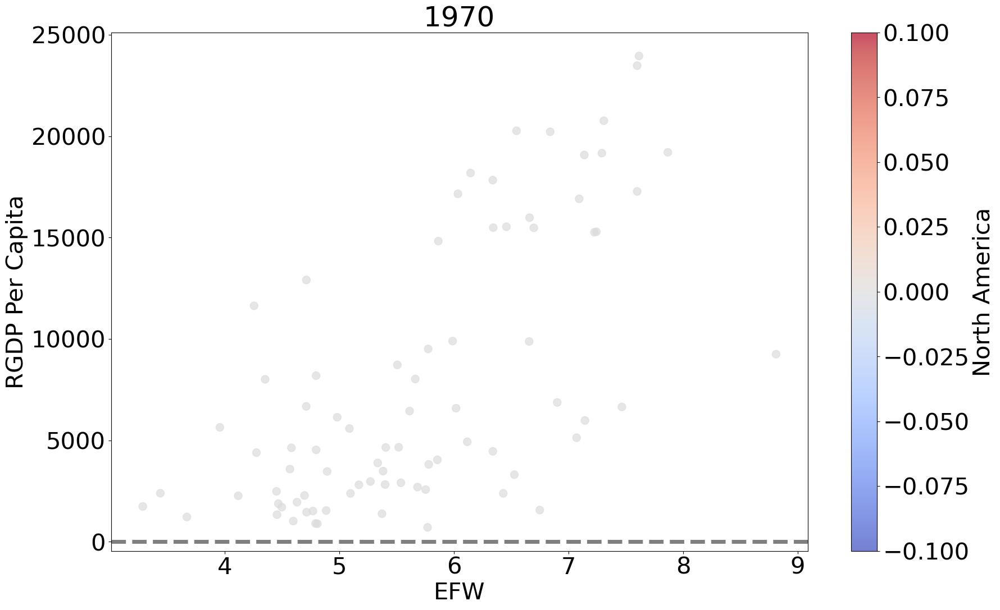

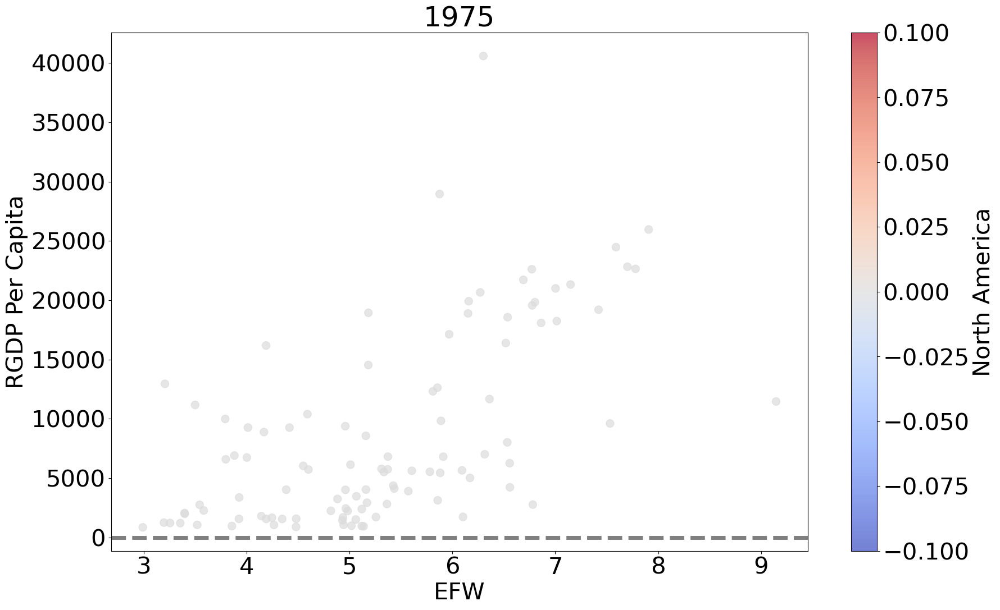

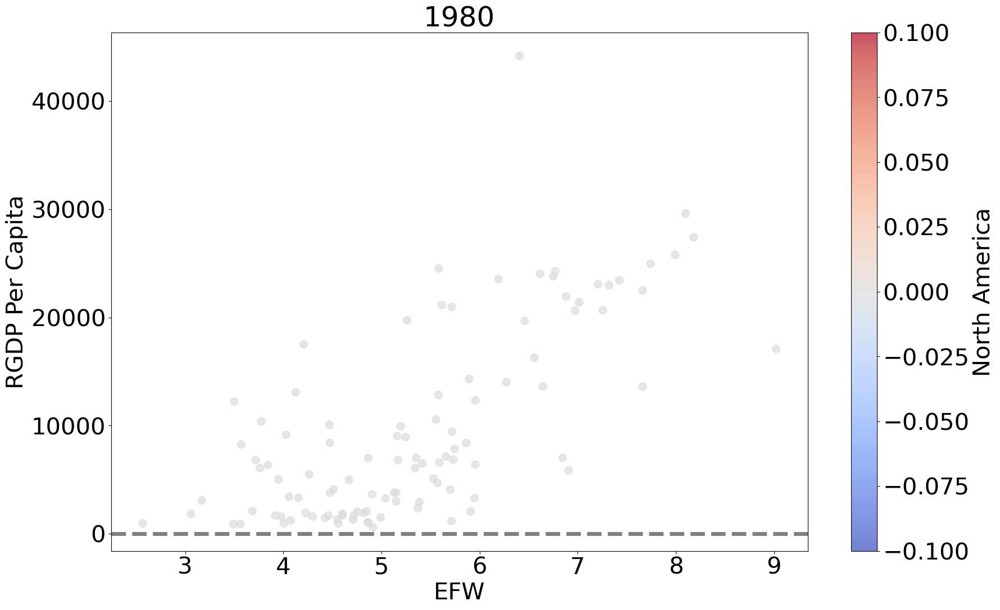

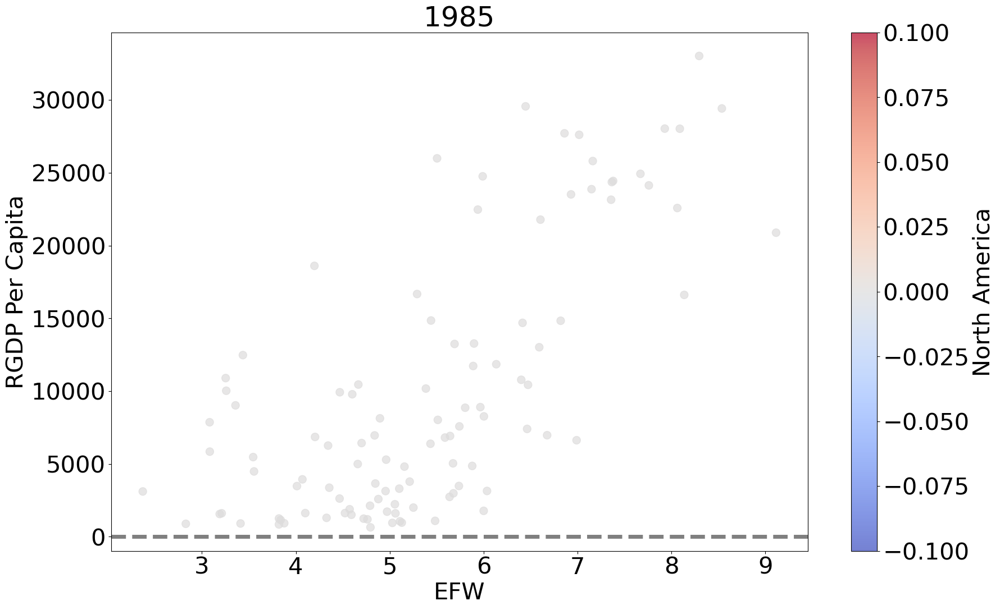

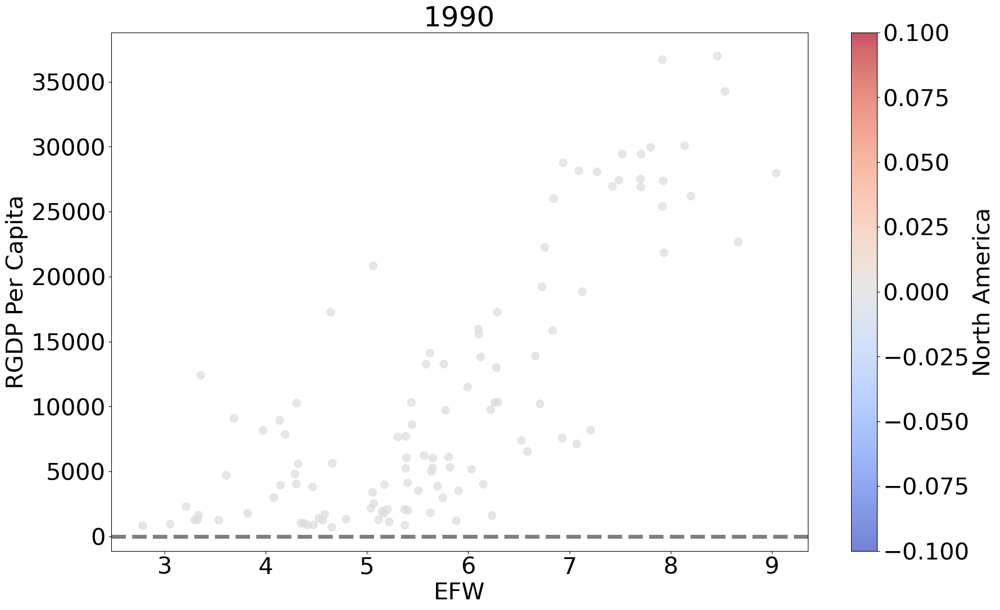

...

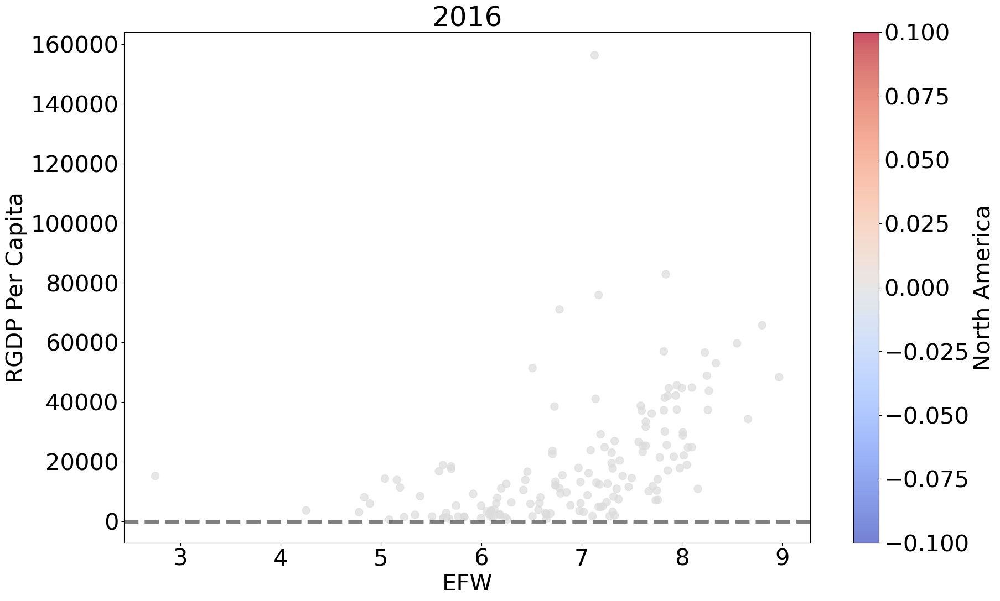

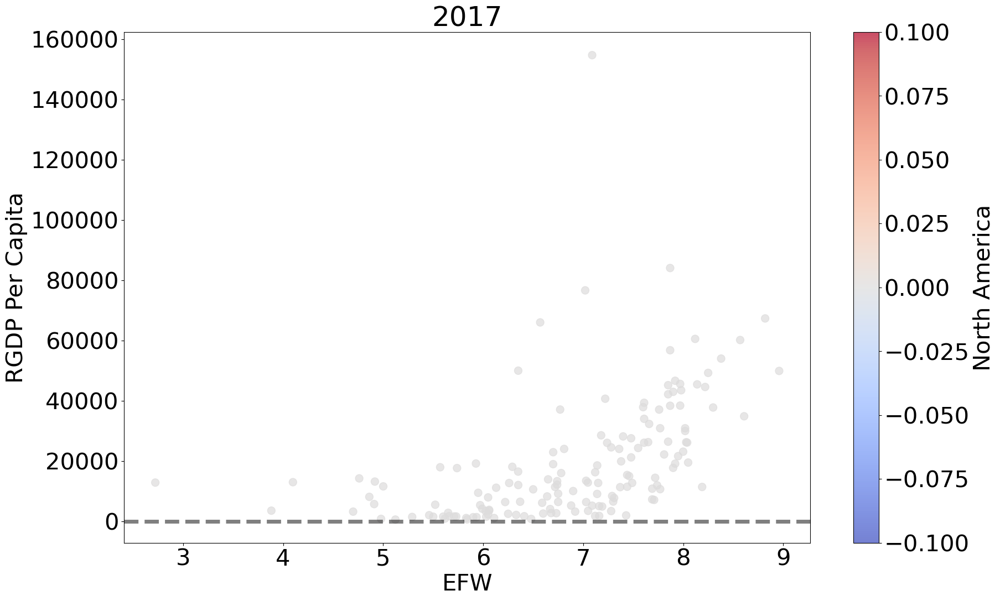

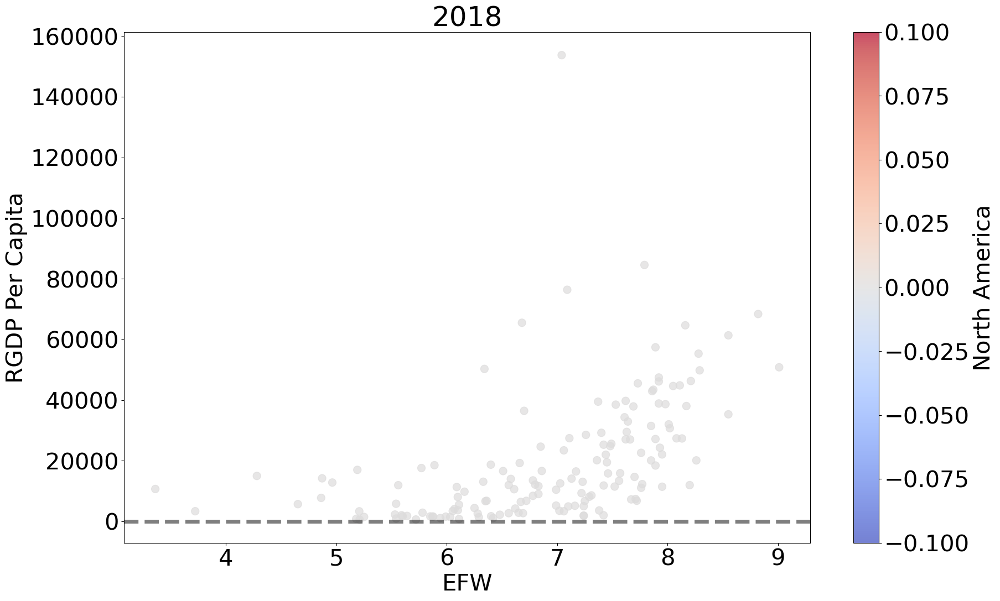

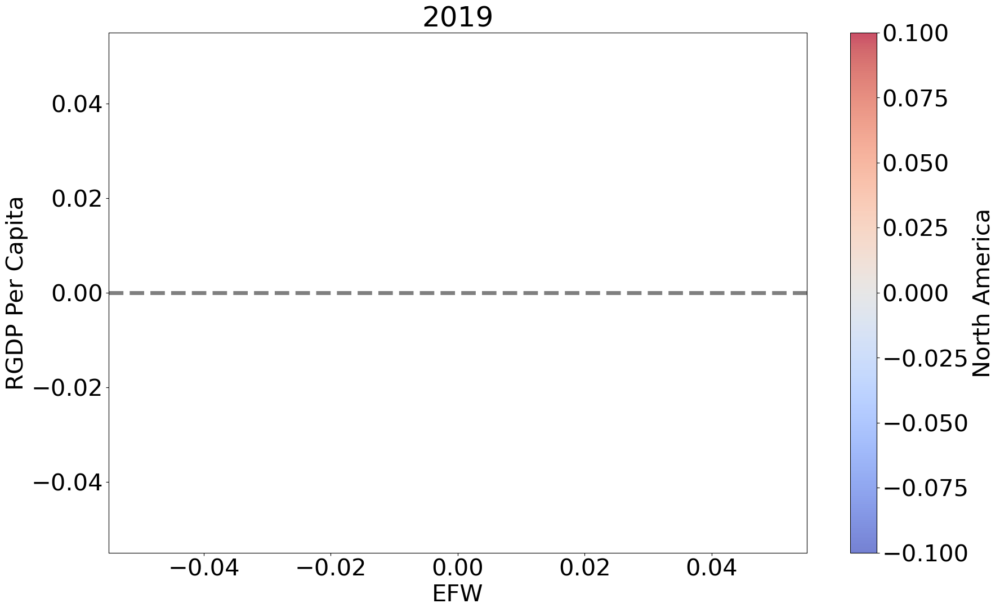

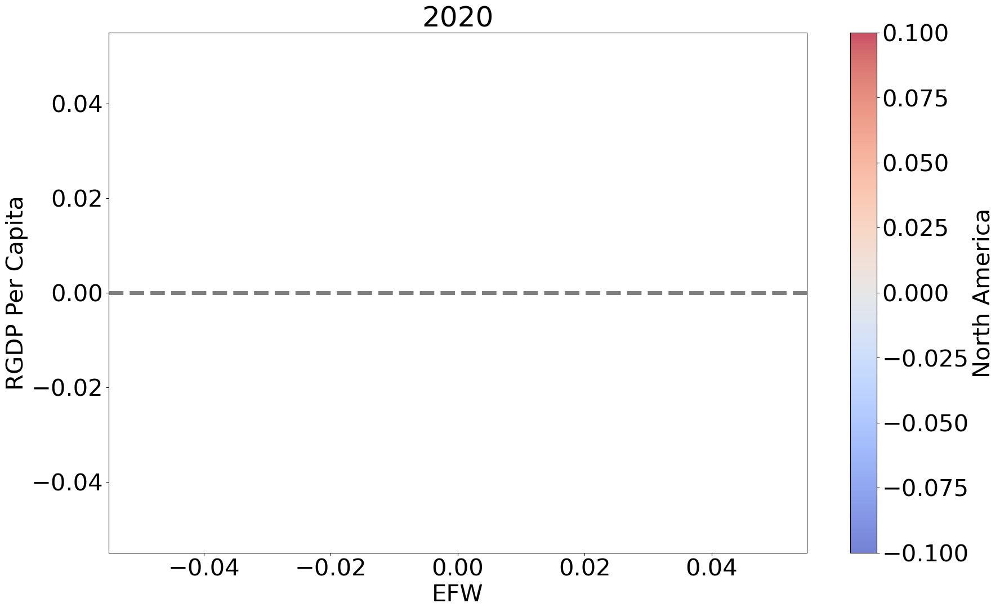

In [7]:
plt.rcParams.update({"font.size":30})
#year = "2000"

for year in years:
    
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (20,12))
    plot_data.plot.scatter(x = "EFW", 
                          y = "RGDP Per Capita",
                          c = "North America",
                          cmap = "coolwarm",
                          s = 100,
                          alpha = .7,
                          ax = ax)
    ax.set_title(str(year)[:4])
    # adds a horizontal dash line at 0
    ax.axhline(0, ls = "--", color = "k", alpha = .5, linewidth = 5)

C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\1399404257.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (20,12))


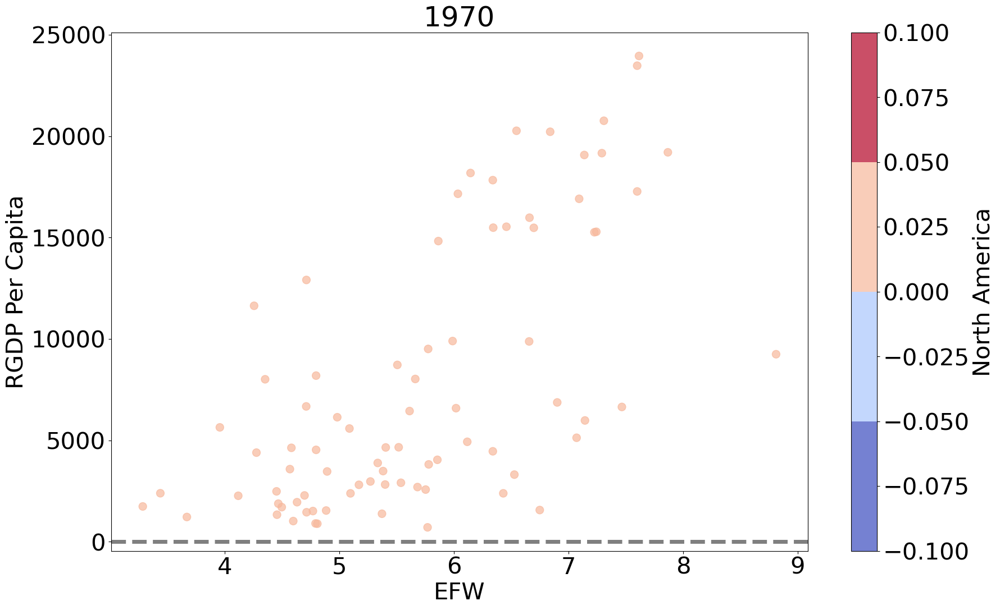

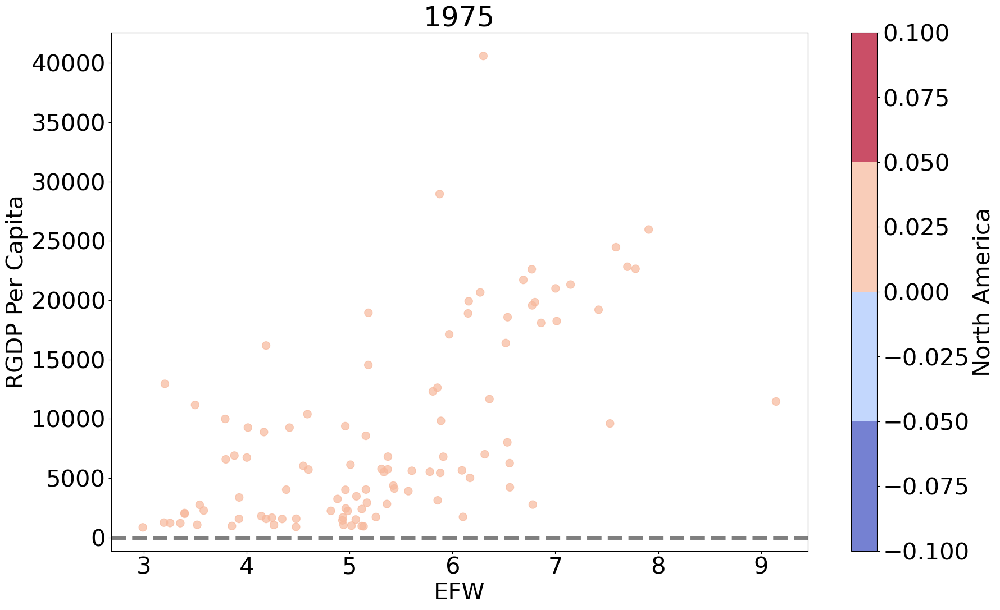

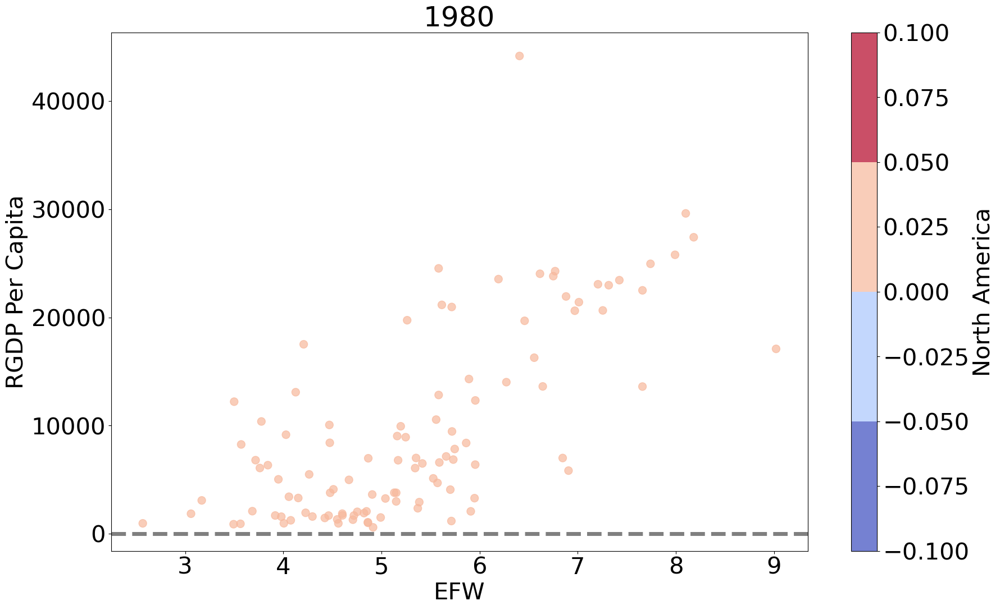

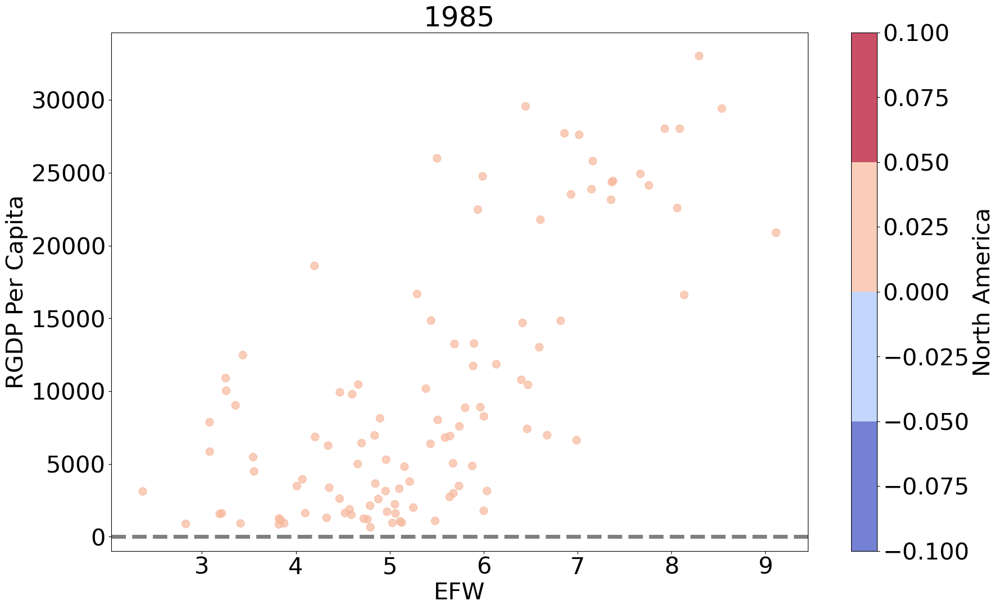

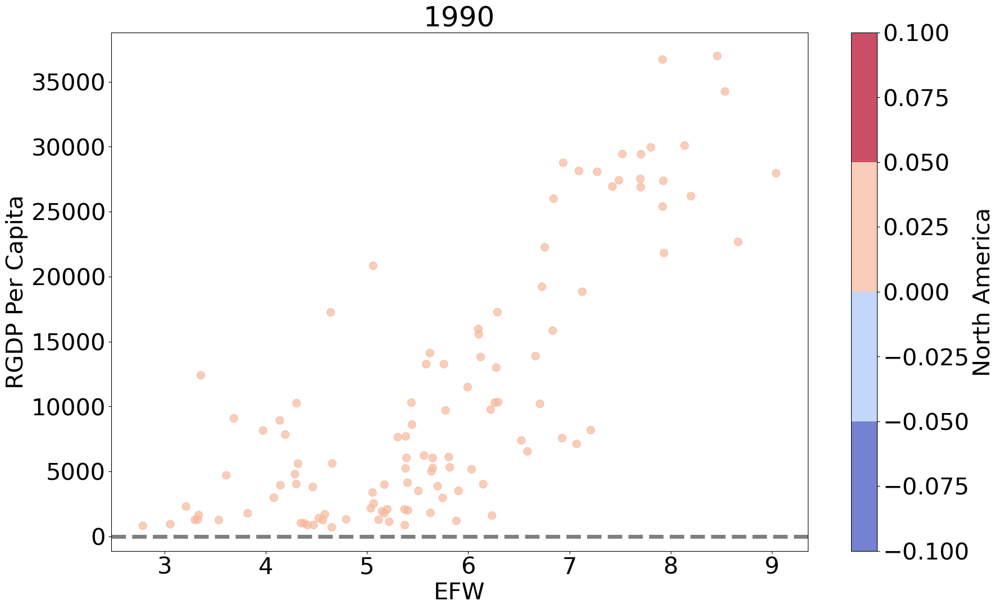

...

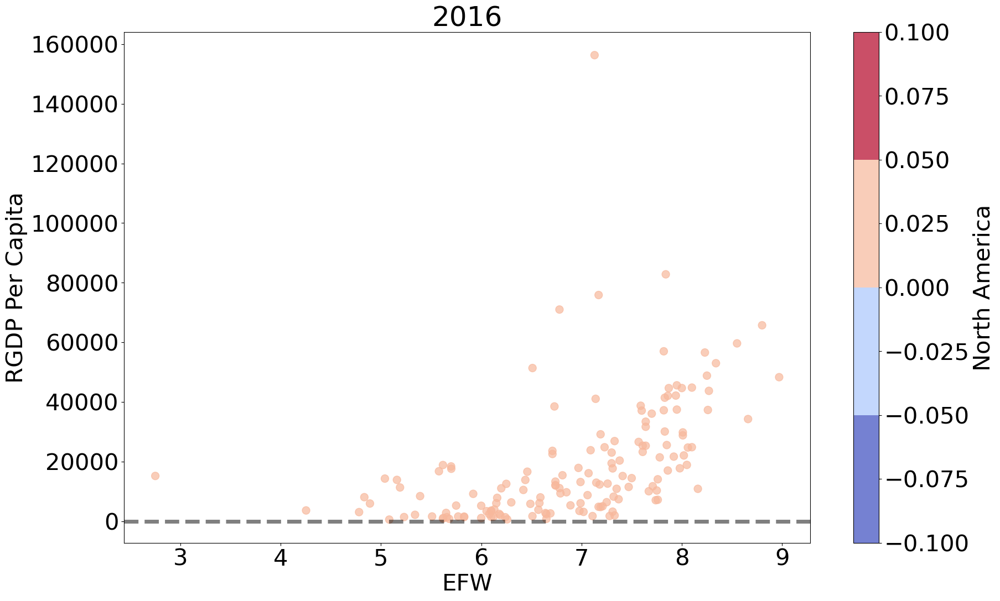

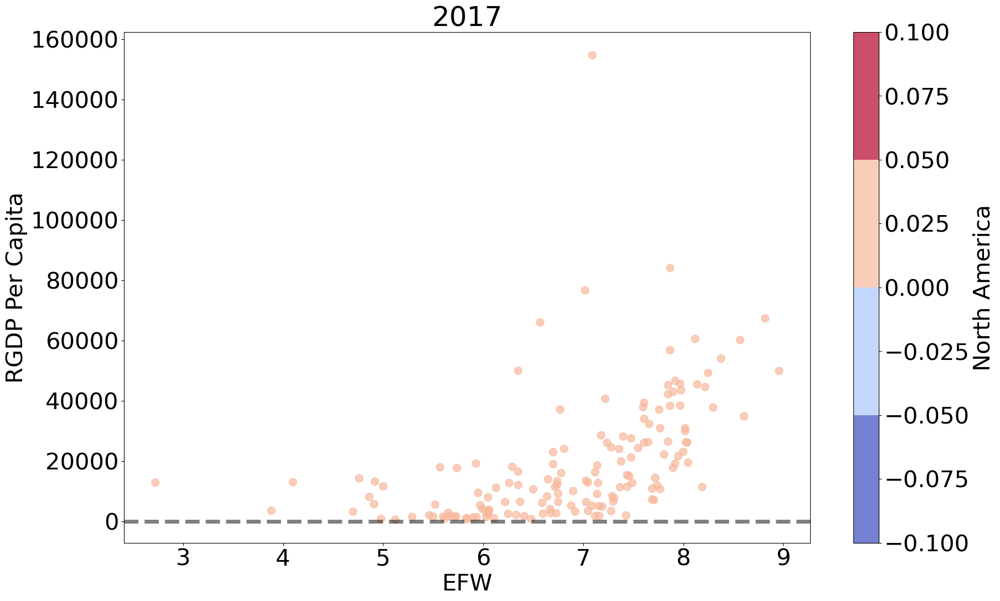

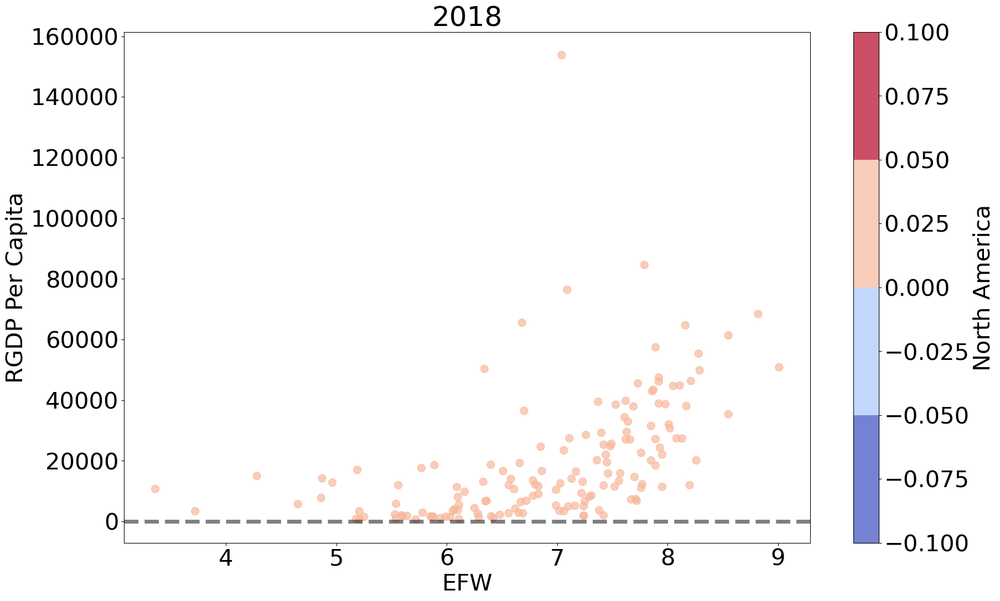

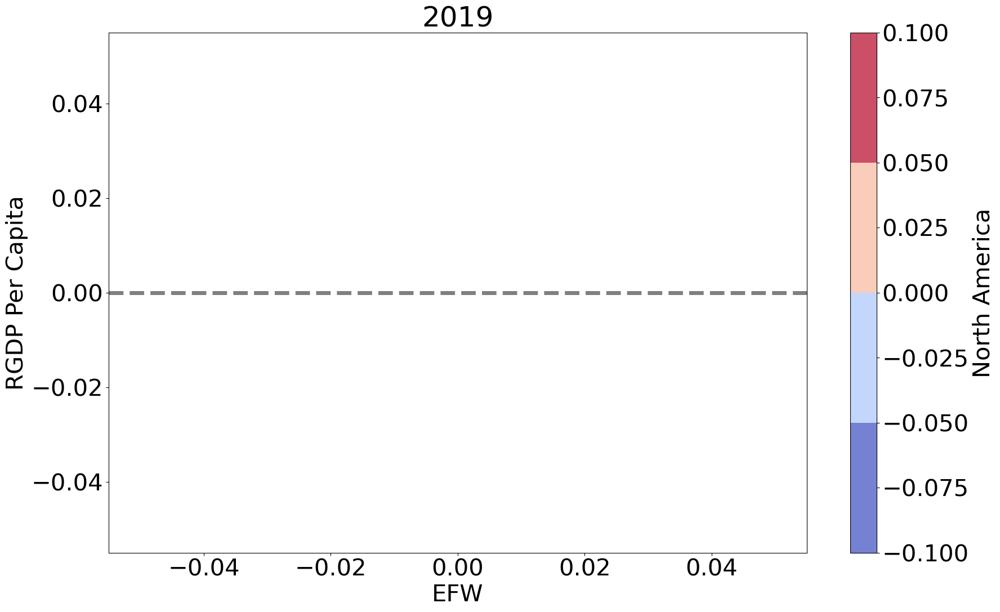

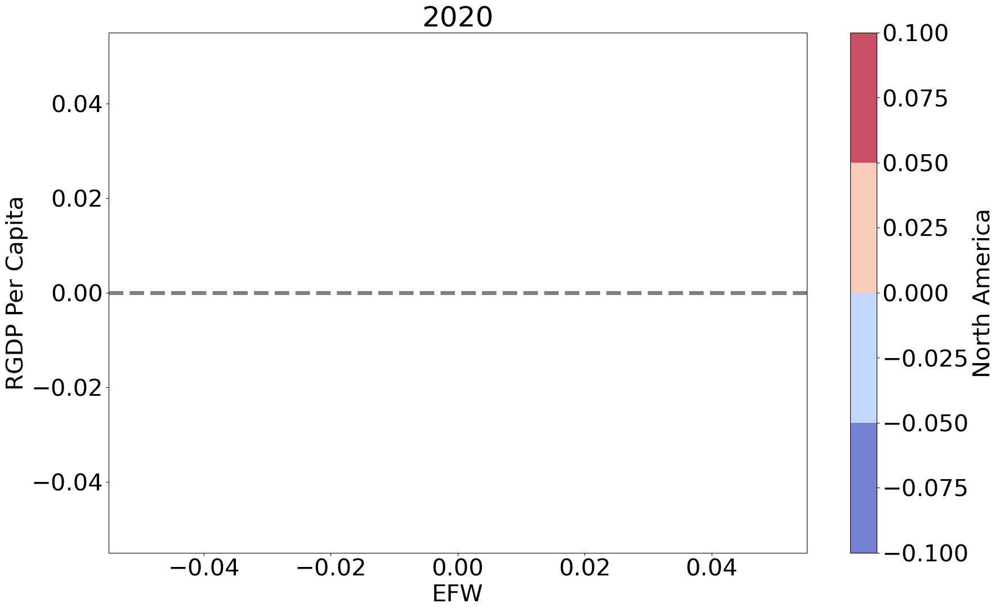

In [8]:
from matplotlib import cm
plt.rcParams.update({"font.size":30})
#year = "2000"
norm = cm.colors.Normalize()
cmap = cm.get_cmap('coolwarm', 4)
for year in years:
    
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (20,12))
    plot_data.plot.scatter(x = "EFW", 
                          y = "RGDP Per Capita",
                          c = "North America",
                          cmap = cmap,
                          s = 100,
                          alpha = .7,
                          ax = ax)
    ax.set_title(str(year)[:4])
    # adds a horizontal dash line at 0
    ax.axhline(0, ls = "--", color = "k", alpha = .5, linewidth = 5)

In [9]:
n = 5
quantile_var = "RGDP Per Capita"
quantile_name = quantile_var + " " + str(n) + "-tile"
data[quantile_name] = np.nan


In [10]:
def create_quantile(n,
                   data,
                   year,
                   quantile_var,
                   quantile_name):
    # index that identifies countries for a given year
    year_index = data.index.get_level_values("Year") == year
    quantile_values_dict = {
        i:data[year_index][quantile_var].quantile(i/n) for i in range(1, n+1)}
    for index in data[year_index].index:
        # identify value of the variable of interest
        val = data.loc[index][quantile_var]
        for i in range(1, n + 1):
            if val <= quantile_values_dict[i]:
                data.loc[index,[quantile_name]] = int((n + 1) - i)
                break
        else:
            continue
        
for year in years:
    create_quantile(n, data, year, quantile_var, quantile_name)
data.loc["USA"]

,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas,RGDP Per Capita,North America,RGDP Per Capita 5-tile
Year,,,,,,,,,,,,,,
1970-01-01,US,North America,NaN,United States,7.615181,5.341231,8.286741,9.588817,8.232334,6.631262,1.648185,23958.0000,0,1.0
1975-01-01,US,North America,NaN,United States,7.907324,5.336851,8.670280,9.067438,8.412407,8.042706,1.483975,25956.0000,0,1.0
1980-01-01,US,North America,NaN,United States,8.101368,5.788734,8.684269,9.122306,8.544966,8.359863,1.322304,29611.0000,0,1.0
1985-01-01,US,North America,NaN,United States,8.295413,6.582616,8.726823,9.339660,8.505198,8.335644,1.031484,33023.0000,0,1.0
1990-01-01,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932,36982.0000,0,1.0
1995-01-01,US,North America,H,United States,8.588435,7.446569,8.587870,9.787931,8.594211,8.538840,0.828418,39390.6254,0,1.0
2000-01-01,US,North America,H,United States,8.648077,7.704726,8.773170,9.607665,8.466601,8.739485,0.683215,45886.4705,0,1.0
2001-01-01,US,North America,H,United States,8.509072,7.521319,8.615158,9.612028,8.397002,8.464019,0.744511,45878.0092,0,1.0
2002-01-01,US,North America,H,United States,8.568646,7.673536,8.370127,9.724310,8.298912,8.819880,0.760212,46266.2959,0,1.0


C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\10941508.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (24,16))


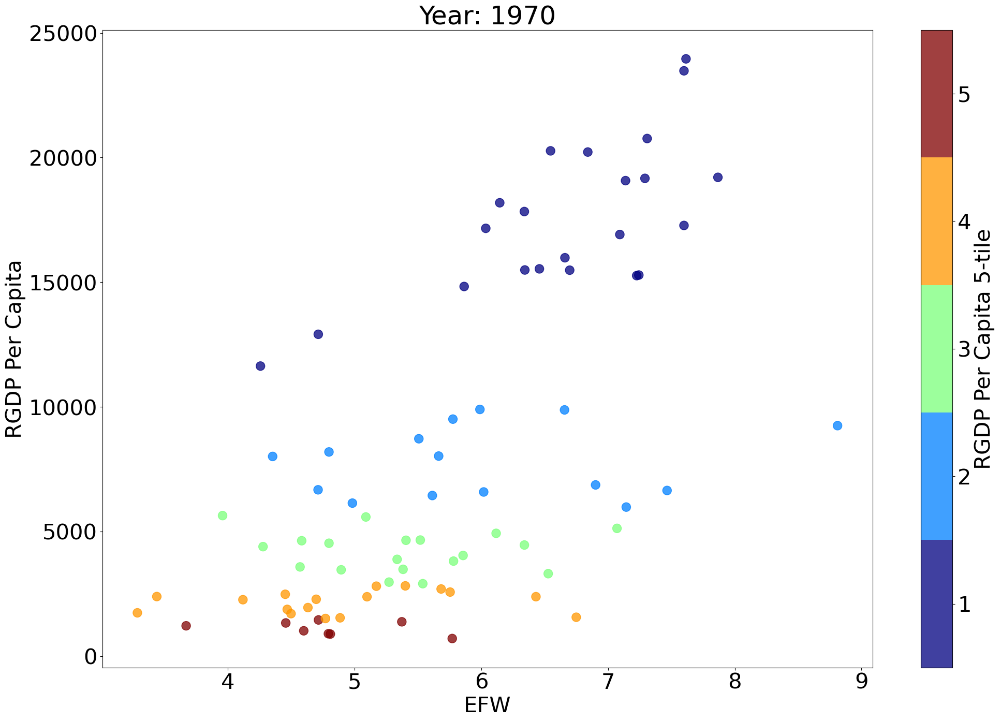

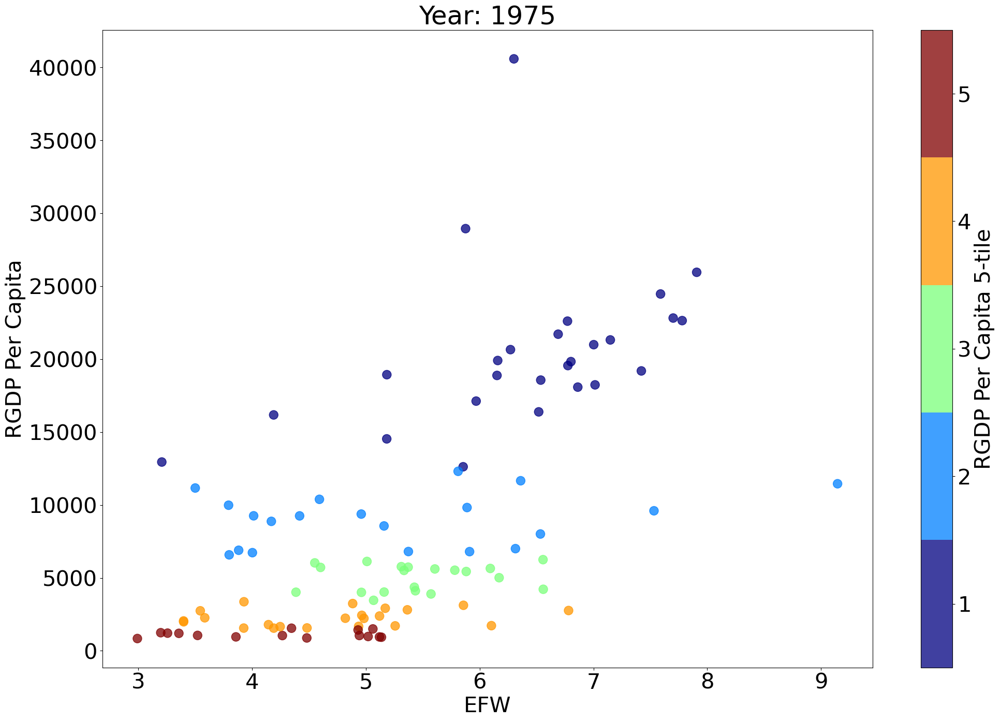

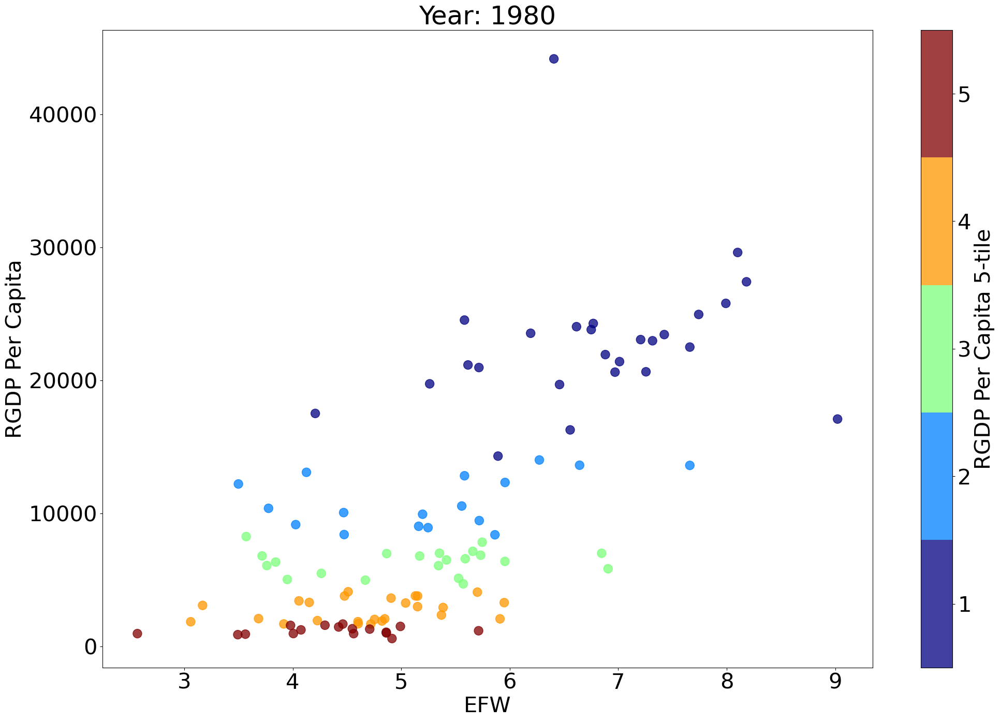

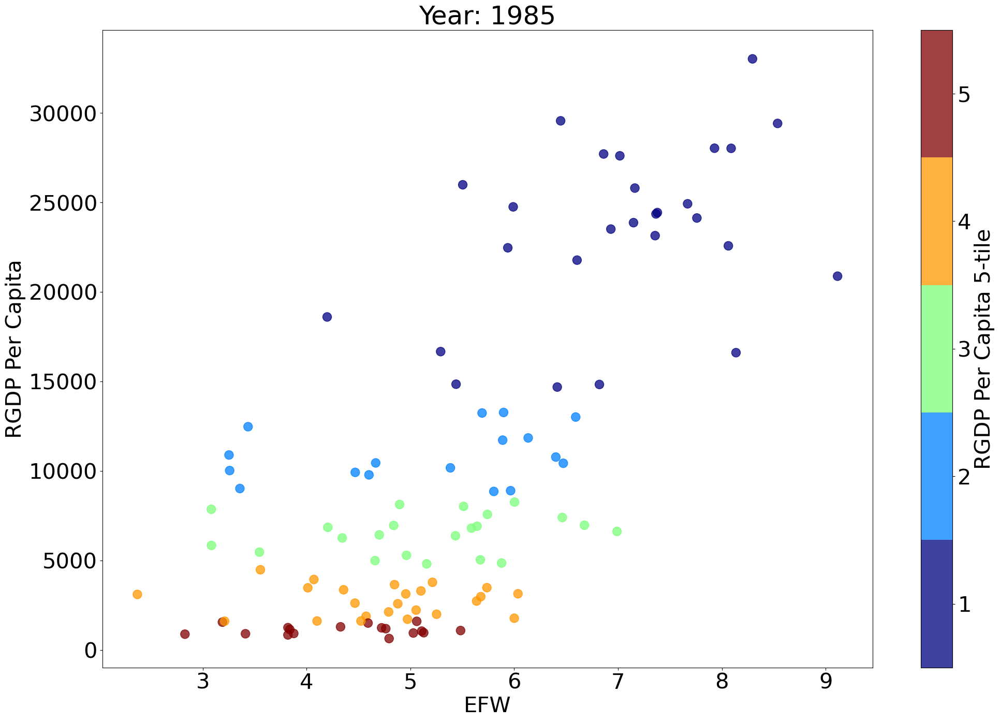

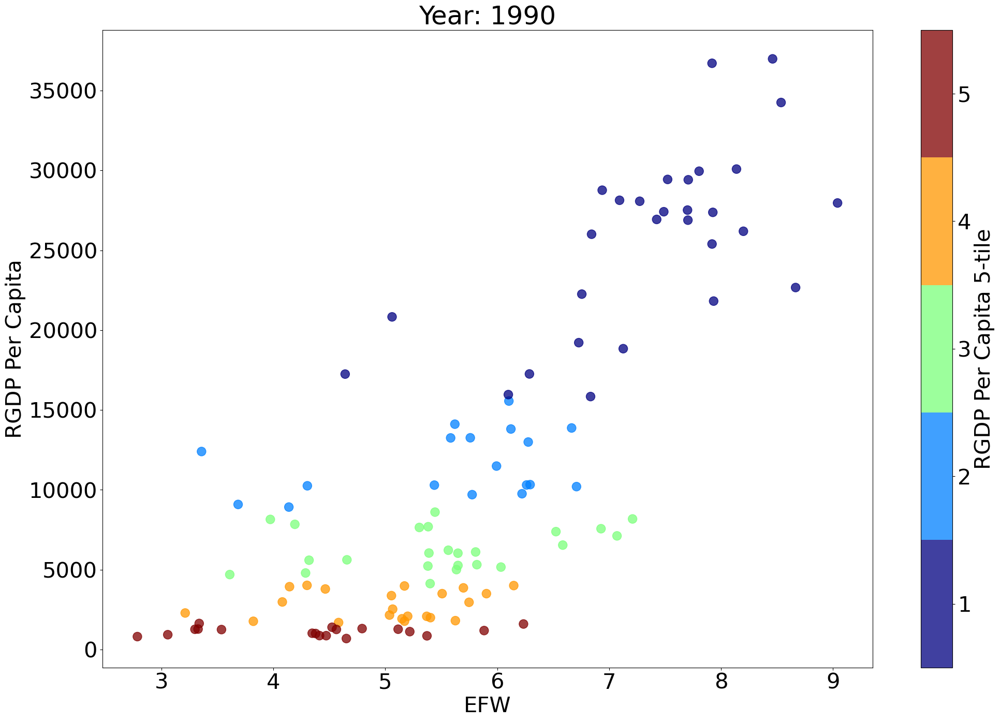

...

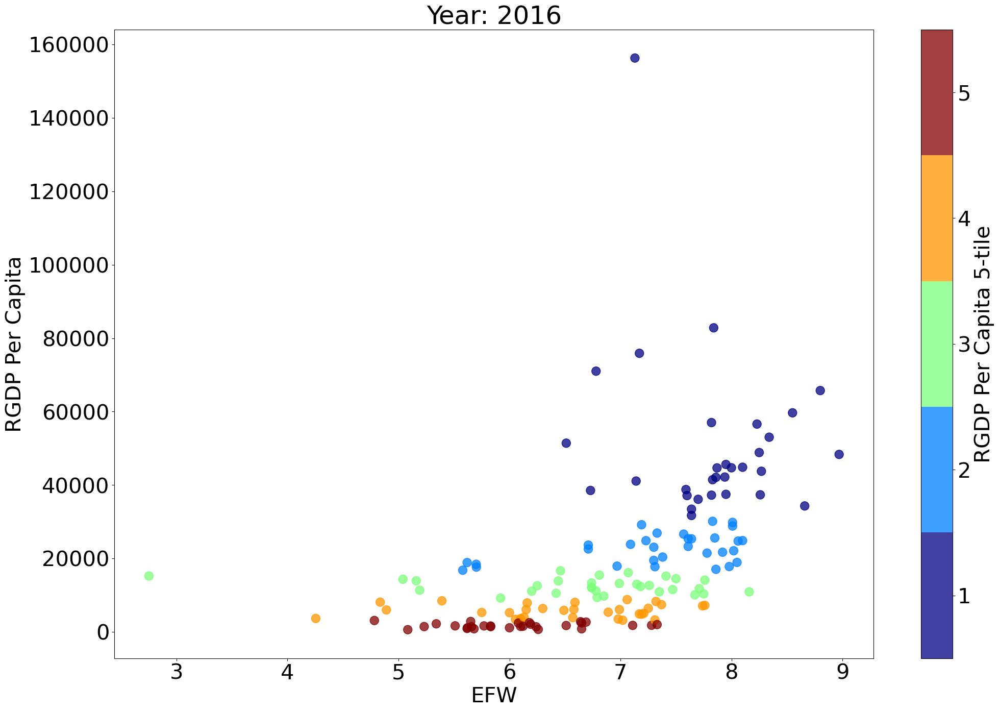

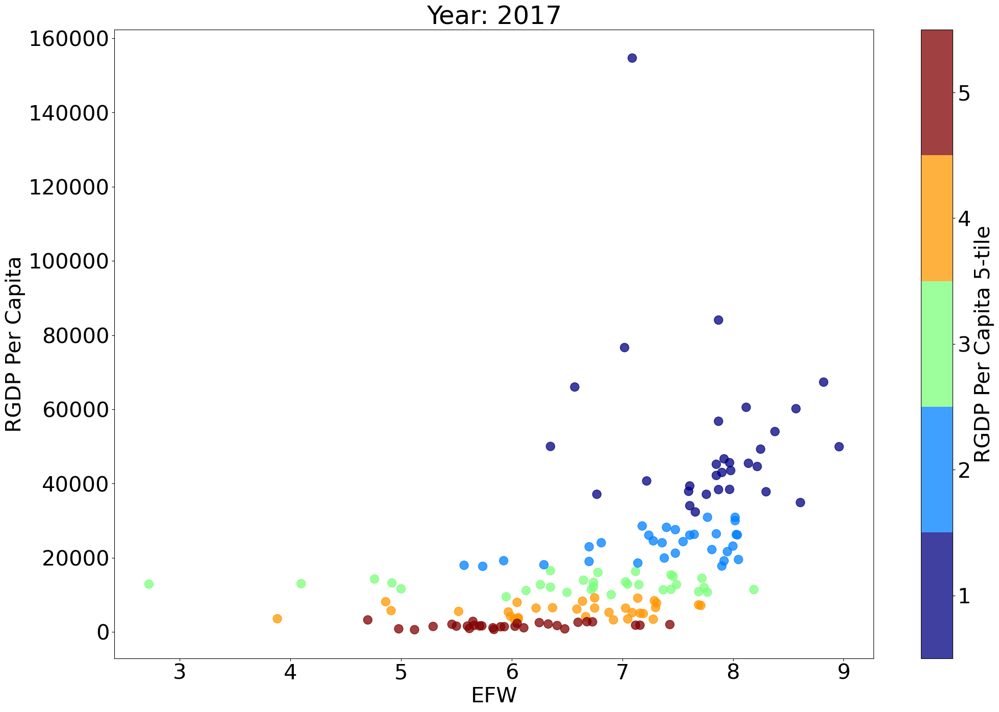

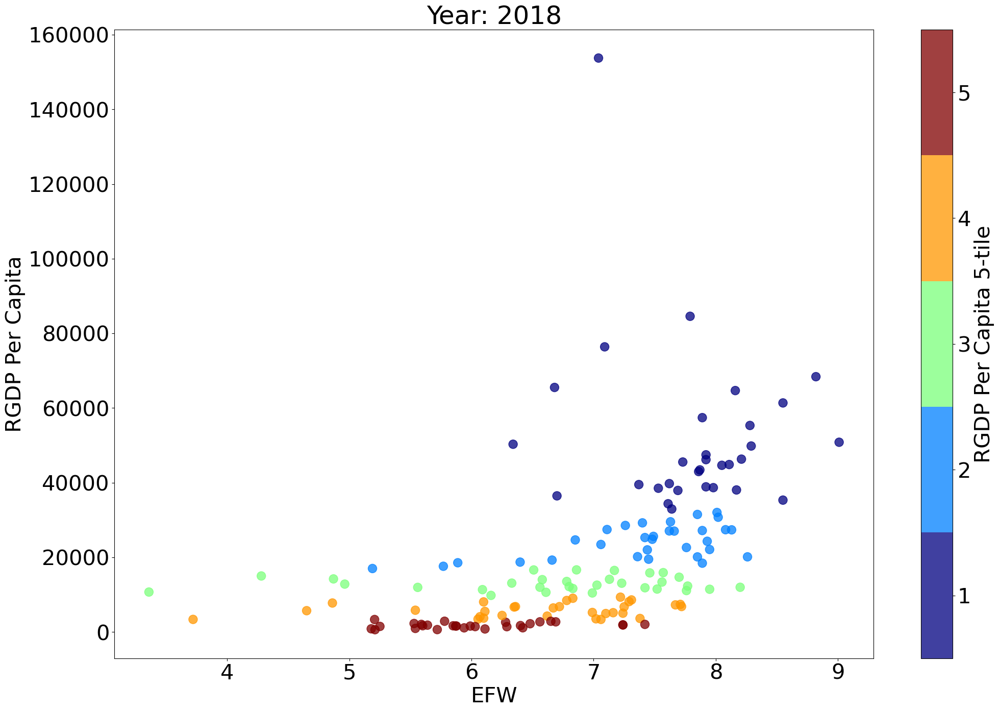

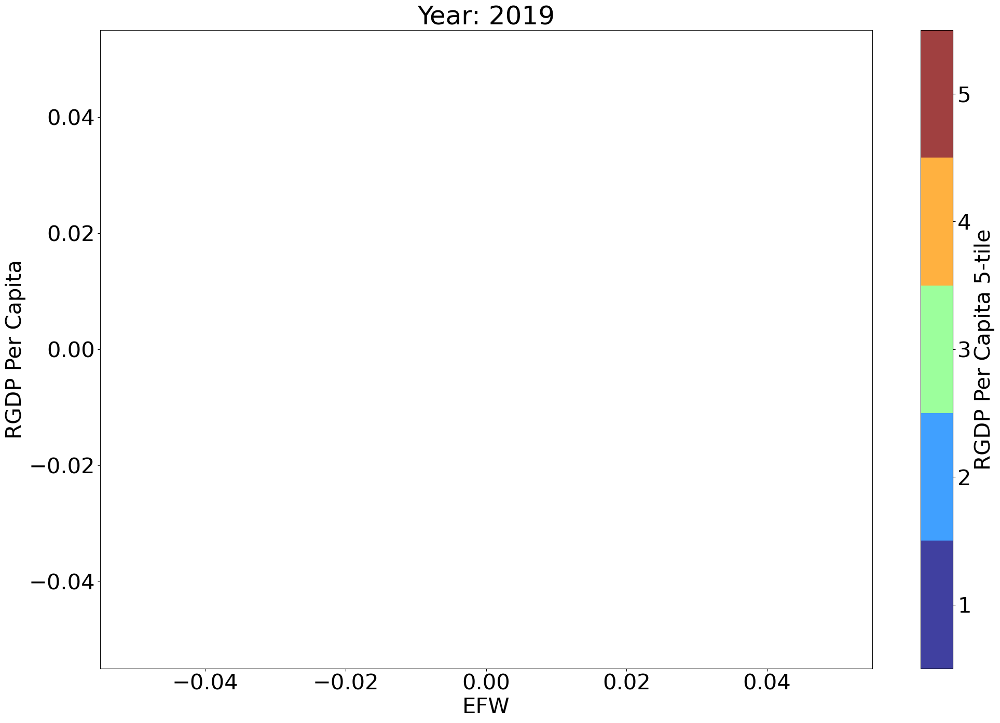

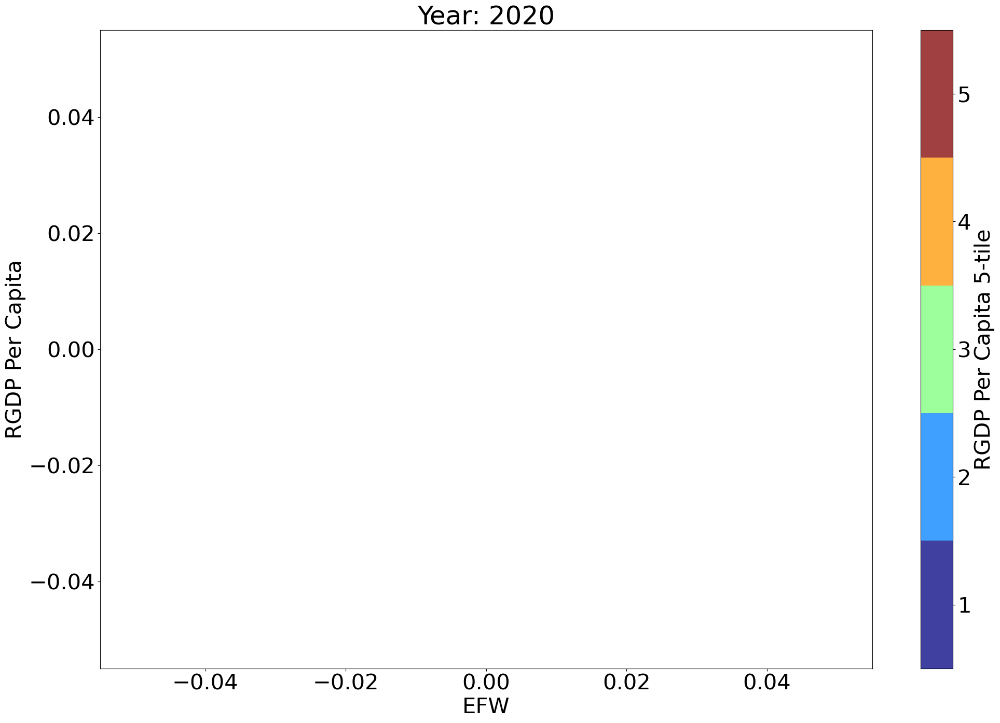

In [11]:
cmap = cm.get_cmap("jet", n)

for year in years:
    # select data for the given year
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (24,16))

    plot_data.plot.scatter(x = "EFW",
                          y = "RGDP Per Capita",
                          c = "RGDP Per Capita " + str(n) + "-tile",
                          cmap = cmap,
                          ax = ax,
                          s = 150,
                            vmin = 0.5,
                           vmax = 5.5,
                          alpha = .75) 
    ax.set_title("Year: " + str(year)[:4])

In [12]:
data[data["North America"] == 1].index.get_level_values("ISO_Code_3").unique()
                                                  

Index([], dtype='object', name='ISO_Code_3')

In [21]:
print(data.columns)


Index(['ISO_Code_2', 'World Bank Region',
       'World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)',
       'Countries', 'EFW', 'Size of Government',
       'Legal System and Property Rights', 'Sound Money',
       'Freedom to Trade Internationally', 'Regulation',
       'Standard Deviation of the 5 EFW Areas', 'RGDP Per Capita',
       'North America', 'RGDP Per Capita 5-tile'],
      dtype='object')


In [25]:
import statsmodels.api as sm

def regress(data, x_names, y_names, constant = False):
    X = reg_data[x_names]
    if constant:
        X["constant"] = 1
    y = reg_data[y_names]
    results = sm.OLS(y,X).fit()
    return results

y_names = ["EFW"]
X_names = ["RGDP Per Capita"]
reg_data = data.dropna()

results = regress(reg_data, X_names, y_names, constant = True)
results.summary()

C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\1037136910.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    EFW   R-squared:                       0.323
Model:                            OLS   Adj. R-squared:                  0.323
Method:                 Least Squares   F-statistic:                     1341.
Date:                Fri, 05 May 2023   Prob (F-statistic):          2.69e-240
Time:                        09:02:48   Log-Likelihood:                -3651.1
No. Observations:                2808   AIC:                             7306.
Df Residuals:                    2806   BIC:                             7318.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
RGDP Per Capita   3.45e-05   9.42e-07     36.618      0.000    3.27e-05    3.63e-05
constant            6.1587      0.023    265.773      0.000       6.113       6.204
==============================================================================
Omnibus:                      563.163   Durbin-Watson:                   0.254
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1220.184
Skew:                          -1.149   Prob(JB):                    1.10e-265
Kurtosis:                       5.268   Cond. No.                     3.40e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\2725329215.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()
C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\2725329215.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resid


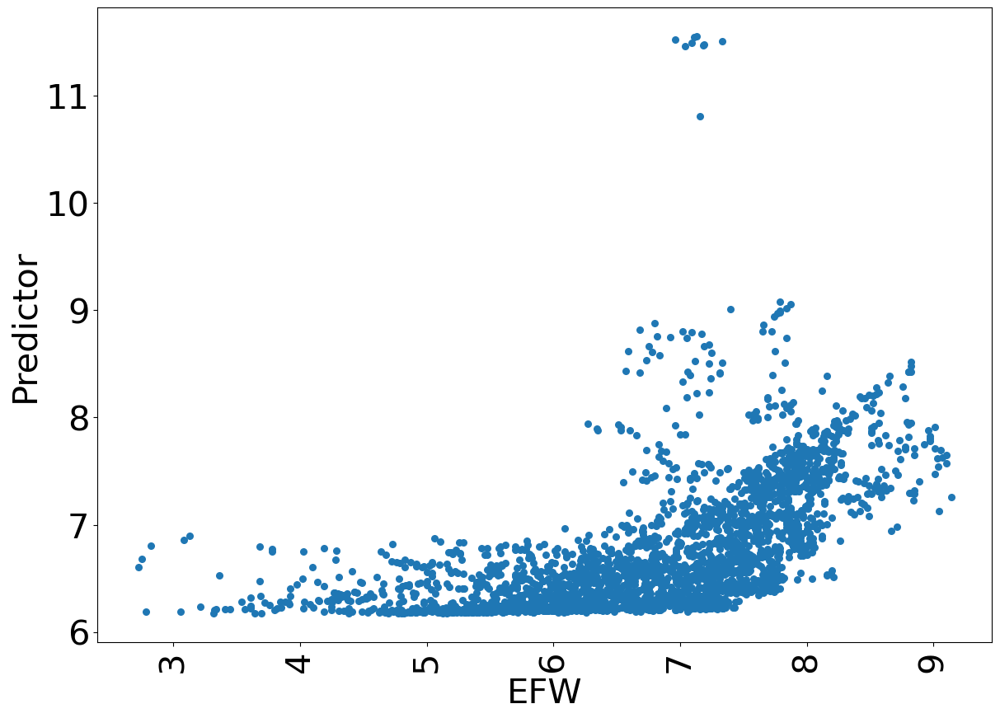

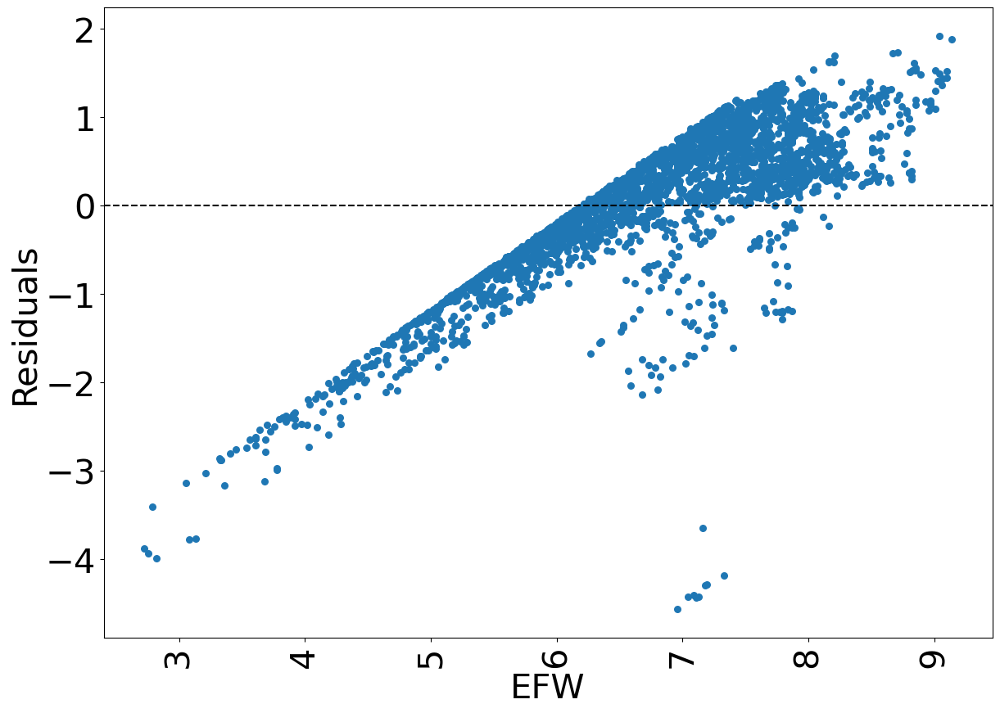

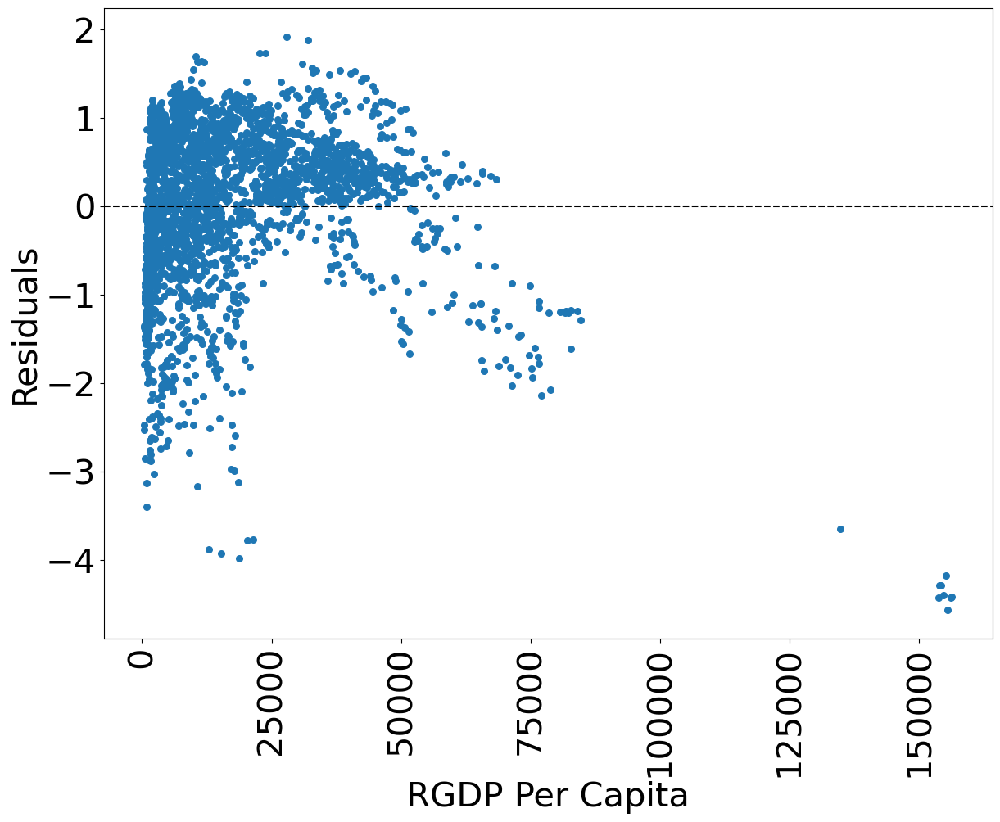

In [29]:
def plot_residuals(df, y_var, x_vars):
    fig, ax = plt.subplots(figsize = (14, 10))
    df.plot.scatter(x = y_var[0],
                     y = "Predictor", 
                      s = 30, ax = ax)
    plt.xticks(rotation=90)
    plt.show()
    plt.close()

    # cycle through all variables included in regression
    #   concatenate y_var and x_vars to form a single list
    for var in y_var + x_vars:
        fig, ax = plt.subplots(figsize = (14,10))
        df.plot.scatter(x = var,
                         y = "Residuals", 
                          s = 30, ax = ax)
        ax.axhline(0, ls = "--", color = "k")
        plt.xticks(rotation=90)
        plt.show()
        plt.close()
reg_data["Predictor"] = results.predict()
reg_data["Residuals"] = results.resid
plot_residuals(reg_data, y_names, X_names)

In [32]:
X_names = ["RGDP Per Capita 5-tile"]
results = regress(reg_data, X_names, y_names, constant = True)
results.summary()

C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\1037136910.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    EFW   R-squared:                       0.397
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     1848.
Date:                Fri, 05 May 2023   Prob (F-statistic):          1.35e-310
Time:                        09:05:30   Log-Likelihood:                -3489.2
No. Observations:                2808   AIC:                             6982.
Df Residuals:                    2806   BIC:                             6994.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
RGDP Per Capita 5-tile    -0.4805      0.011    -42.984      0.000      -0.502      -0.459
constant                   8.1333      0.036    226.069      0.000       8.063       8.204
==============================================================================
Omnibus:                      481.454   Durbin-Watson:                   0.326
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              937.417
Skew:                          -1.039   Prob(JB):                    2.77e-204
Kurtosis:                       4.923   Cond. No.                         7.90
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [35]:
X_names = ["RGDP Per Capita"]
reg_data = reg_data[y_name + X_names].groupby("ISO_Code_3").diff().dropna()
results = regress(reg_data,
                  X_names, y_names, constant = False)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    EFW   R-squared (uncentered):                   0.006
Model:                            OLS   Adj. R-squared (uncentered):              0.006
Method:                 Least Squares   F-statistic:                              15.52
Date:                Fri, 05 May 2023   Prob (F-statistic):                    8.37e-05
Time:                        09:05:47   Log-Likelihood:                         -609.15
No. Observations:                2504   AIC:                                      1220.
Df Residuals:                    2503   BIC:                                      1226.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
RGDP Per Capita  1.897e-05   4.81e-06      3.940      0.000    9.53e-06    2.84e-05
==============================================================================
Omnibus:                      537.925   Durbin-Watson:                   2.623
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8716.358
Skew:                          -0.561   Prob(JB):                         0.00
Kurtosis:                      12.071   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

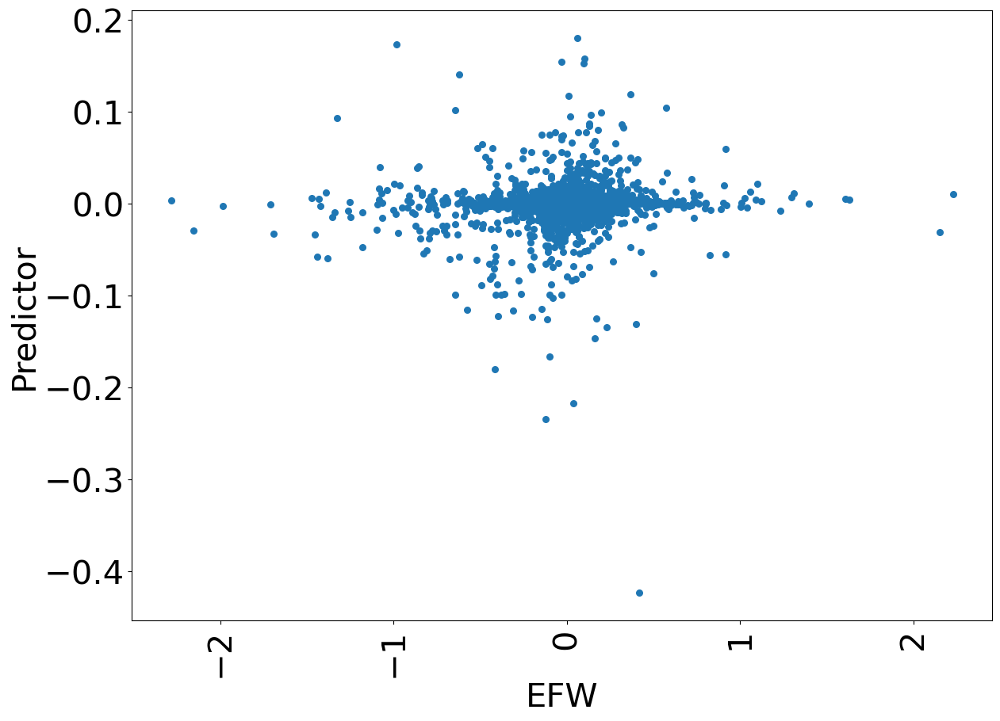

KeyError: 'Residuals'

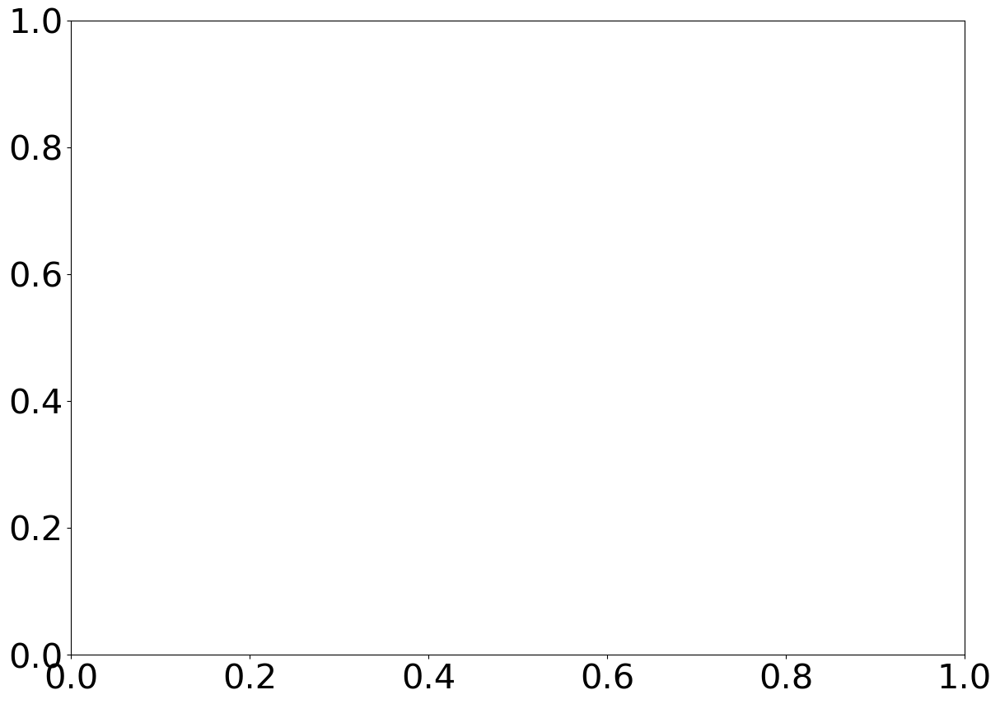

In [36]:
reg_data["Predictor"] = results.predict()
reg_data["residuals"] = results.resid
plot_residuals(reg_data, y_names, X_names)

## Panel Regression

In [37]:
!pip install linearmodels

In [38]:
# changing regression type from OLS to panel
from linearmodels import PanelOLS
def panel_regress(data, x_names, y_names,
                  constant = False,
                  entity = False,
                  time = False):
    X = data[x_names]
    if constant:
        X["constant"] = 1
    y = data[y_name]
    results = PanelOLS(y,
                      X,
                      entity_effects = entity,
                      time_effects = time).fit(cov_type='clustered', cluster_entity=True)
    return results

reg_data = data.dropna()
results = panel_regress(reg_data, X_names,
                       y_name,
                       constant = True,
                       entity = True,
                       time = True)
results

C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\2757580554.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1


Dep. Variable:,EFW,R-squared:,0.0121
Estimator:,PanelOLS,R-squared (Between):,-0.3218
No. Observations:,2808,R-squared (Within):,-0.0840
Date:,"Fri, May 05 2023",R-squared (Overall):,-0.2833
Time:,09:06:00,Log-likelihood,-1043.6
Cov. Estimator:,Clustered,,
,,F-statistic:,32.191
Entities:,165,P-value,0.0000
Avg Obs:,17.018,Distribution:,"F(1,2635)"
Min Obs:,0.0000,,
Max Obs:,21.000,F-statistic (robust):,7.6217


C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\2300779465.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()
C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\2300779465.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["residuals"] = results.resids


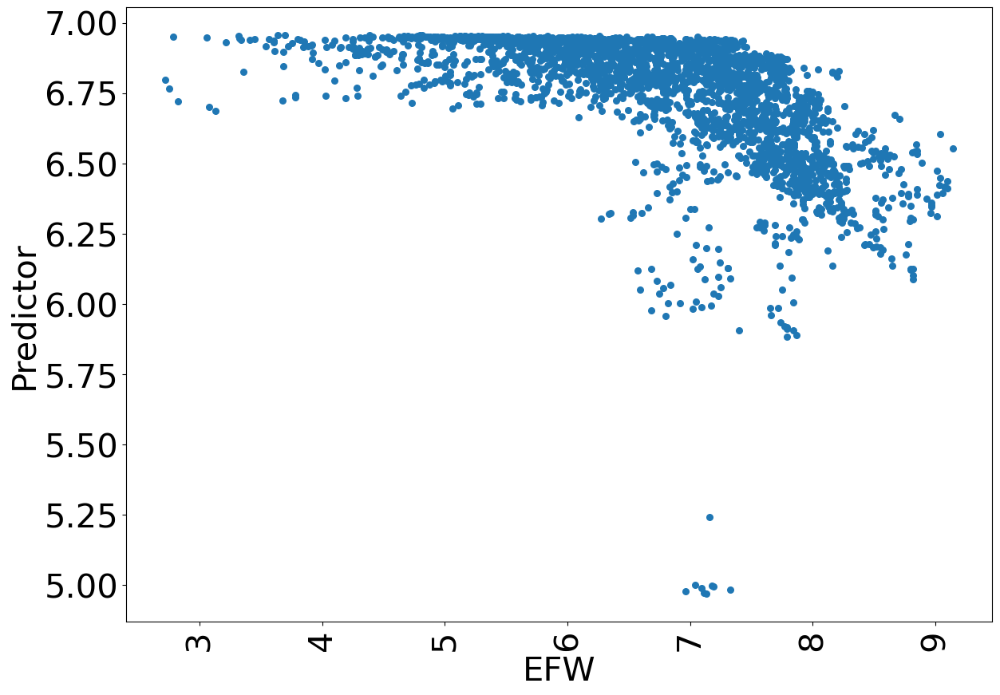

KeyError: 'Residuals'

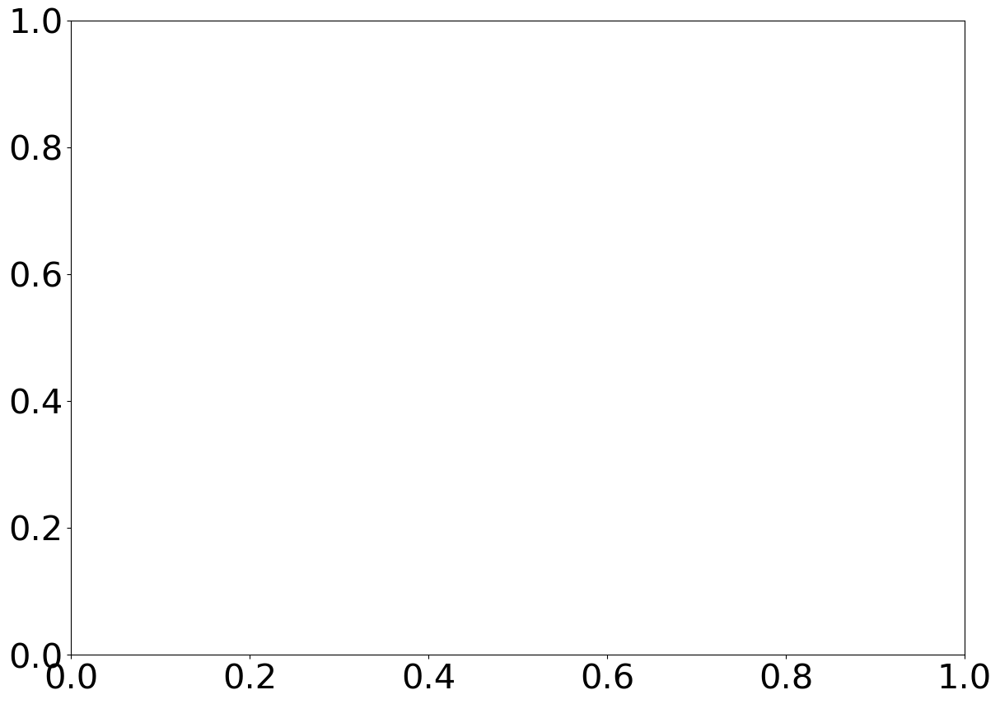

In [39]:
reg_data["Predictor"] = results.predict()
reg_data["residuals"] = results.resids
plot_residuals(reg_data, y_names, X_names)

In [40]:
# finding that resid is actually resids
results.__dict__

{'_params': array([-1.27549057e-05,  6.96109193e+00]),
 '_deferred_cov': <bound method HomoskedasticCovariance.deferred_cov of <linearmodels.panel.covariance.ClusteredCovariance object at 0x000002A00A6F3D60>>,
 '_debiased': True,
 '_df_resid': 2635,
 '_df_model': 173,
 '_nobs': 2808,
 '_name': 'PanelOLS',
 '_var_names': ['RGDP Per Capita', 'constant'],
 '_residual_ss': 345.72301787913415,
 '_total_ss': 349.94657125621814,
 '_r2': 0.012069137759865844,
 '_r2w': -0.0840187770205354,
 '_r2b': -0.3218301080230128,
 '_r2o': -0.2832630423313782,
 '_c2w': 0.09133185990045979,
 '_c2b': 0.28952002796366066,
 '_c2o': 0.3233435268445438,
 '_s2': 0.13120418135830517,
 '_entity_info': mean       17.018182
 median     21.000000
 max        21.000000
 min         0.000000
 total     165.000000
 Name: Observations per entity, dtype: float64,
 '_time_info': mean      112.32
 median    135.00
 max       152.00
 min         0.00
 total      25.00
 Name: Observations per time period, dtype: float64,
 'mod

In [47]:
for entity in [True, False]:
    for time in [True, False]:
        reg_data = data.dropna()
        results = panel_regress(reg_data, X_names, 
                      y_name,
                      constant = True,
                     entity = entity,
                     time = time)
        print("Entity: " + str(entity) + "\nTime: " + str(time))
        print(results)
        reg_data["Predictor"] = results.predict()
        reg_data["Residuals"] = results.resids
        plot_residuals(reg_data, y_names, X_names)

C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\2757580554.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1


AbsorbingEffectError: 
The model cannot be estimated. The included effects have fully absorbed
one or more of the variables. This occurs when one or more of the dependent
variable is perfectly explained using the effects included in the model.

The following variables or variable combinations have been fully absorbed
or have become perfectly collinear after effects are removed:

          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, Legal System and Property Rights, constant

Set drop_absorbed=True to automatically drop absorbed variables.


In [42]:
X_names = list(data.keys())[2:7]
y_name = ["RGDP Per Capita"]


for entity in [True, False]:
    for time in [True, False]:
        reg_data = data.dropna()
        results = panel_regress(reg_data, X_names,
                       y_name,
                       constant = True,
                       entity = True,
                       time = True)
        print("Entity: " + str(entity) + "\nTime: " + str(time))
        print(results)
        reg_data["Predictor"] = results.predict()
        reg_data["residuals"] = results.resids
        plot_residuals(reg_data, y_names, X_names)

C:\Users\adamp\AppData\Local\Temp\ipykernel_1384\2757580554.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1


AbsorbingEffectError: 
The model cannot be estimated. The included effects have fully absorbed
one or more of the variables. This occurs when one or more of the dependent
variable is perfectly explained using the effects included in the model.

The following variables or variable combinations have been fully absorbed
or have become perfectly collinear after effects are removed:

          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, constant
          World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).H, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).L, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).LM, World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income).UM, Countries.Algeria, Countries.Angola, Countries.Argentina, Countries.Armenia, Countries.Australia, Countries.Austria, Countries.Azerbaijan, Countries.Bahrain, Countries.Bangladesh, Countries.Barbados, Countries.Belarus, Countries.Belgium, Countries.Benin, Countries.Bolivia, Countries.Bosnia and Herzegovina, Countries.Botswana, Countries.Brazil, Countries.Bulgaria, Countries.Burkina Faso, Countries.Burundi, Countries.Cabo Verde, Countries.Cambodia, Countries.Cameroon, Countries.Canada, Countries.Central African Republic, Countries.Chad, Countries.Chile, Countries.China, Countries.Colombia, Countries.Congo, Dem. Rep., Countries.Congo, Rep., Countries.Costa Rica, Countries.Cote d'Ivoire, Countries.Croatia, Countries.Cyprus, Countries.Czech Republic, Countries.Denmark, Countries.Dominican Republic, Countries.Ecuador, Countries.Egypt, Arab Rep., Countries.El Salvador, Countries.Estonia, Countries.Eswatini, Countries.Ethiopia, Countries.Finland, Countries.France, Countries.Gabon, Countries.Gambia, The, Countries.Georgia, Countries.Germany, Countries.Ghana, Countries.Greece, Countries.Guatemala, Countries.Guinea, Countries.Guinea-Bissau, Countries.Haiti, Countries.Honduras, Countries.Hong Kong SAR, China, Countries.Hungary, Countries.Iceland, Countries.India, Countries.Indonesia, Countries.Iran, Islamic Rep., Countries.Iraq, Countries.Ireland, Countries.Israel, Countries.Italy, Countries.Jamaica, Countries.Japan, Countries.Jordan, Countries.Kazakhstan, Countries.Kenya, Countries.Korea, Rep., Countries.Kuwait, Countries.Kyrgyz Republic, Countries.Lao PDR, Countries.Latvia, Countries.Lebanon, Countries.Lesotho, Countries.Liberia, Countries.Libya, Countries.Lithuania, Countries.Luxembourg, Countries.Madagascar, Countries.Malawi, Countries.Malaysia, Countries.Mali, Countries.Malta, Countries.Mauritania, Countries.Mauritius, Countries.Mexico, Countries.Moldova, Countries.Mongolia, Countries.Montenegro, Countries.Morocco, Countries.Mozambique, Countries.Myanmar, Countries.Nepal, Countries.Netherlands, Countries.New Zealand, Countries.Nicaragua, Countries.Niger, Countries.Nigeria, Countries.North Macedonia, Countries.Norway, Countries.Oman, Countries.Pakistan, Countries.Panama, Countries.Paraguay, Countries.Peru, Countries.Philippines, Countries.Poland, Countries.Portugal, Countries.Qatar, Countries.Romania, Countries.Russian Federation, Countries.Rwanda, Countries.Saudi Arabia, Countries.Senegal, Countries.Serbia, Countries.Seychelles, Countries.Sierra Leone, Countries.Singapore, Countries.Slovak Republic, Countries.Slovenia, Countries.South Africa, Countries.Spain, Countries.Sri Lanka, Countries.Sudan, Countries.Sweden, Countries.Switzerland, Countries.Syrian Arab Republic, Countries.Taiwan, Countries.Tajikistan, Countries.Tanzania, Countries.Thailand, Countries.Togo, Countries.Trinidad and Tobago, Countries.Tunisia, Countries.Turkey, Countries.Uganda, Countries.Ukraine, Countries.United Arab Emirates, Countries.United Kingdom, Countries.United States, Countries.Uruguay, Countries.Venezuela, RB, Countries.Vietnam, Countries.Yemen, Rep., Countries.Zambia, Countries.Zimbabwe, Legal System and Property Rights, constant

Set drop_absorbed=True to automatically drop absorbed variables.
